# Two Dimensional Histogram Filter - Your First Feature (and your first bug).
Writing code is important. But a big part of being on a self driving car team is working with a **large** existing codebase. On high stakes engineering projects like a self driving car, you will probably have to earn the trust of your managers and coworkers before they'll let you make substantial changes to the code base. 

A typical assignment for someone new to a team is to make progress on a backlog of bugs. So with that in mind, that's what you will be doing for your first project in the Nanodegree.

You'll go through this project in a few parts:

1. **Explore the Code** - don't worry about bugs at this point. The goal is to get a feel for how this code base is organized and what everything does.
2. **Implement a Feature** - write code that gets the robot moving correctly.
3. **Fix a Bug** - Implementing motion will reveal a bug which hadn't shown up before. Here you'll identify what the bug is and take steps to reproduce it. Then you'll identify the cause and fix it.


## Part 1: Exploring the code
In this section you will just run some existing code to get a feel for what this localizer does.

You can navigate through this notebook using the arrow keys on your keyboard. You can run the code in a cell by pressing **`Ctrl + Enter`**

Navigate through the cells below. In each cell you should

1. Read through the code. It's okay to not understand everything at this point. 
2. Make a guess about what will happen when you run the code. 
3. Run the code and compare what you see with what you expected. 
4. When you get to a **TODO** read the instructions carefully and complete the activity.



In [1]:
# This code "imports" code from some of the other files we've written
# in this directory. Specifically simulate.py and helpers.py
import simulate as sim
import helpers
import localizer

# Don't worry too much about this code for now...
from __future__ import division, print_function
%load_ext autoreload
%autoreload 2

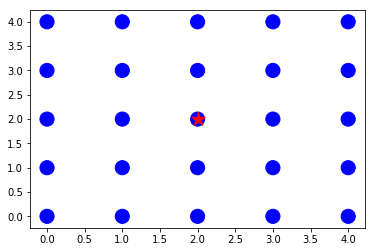

In [2]:
# This code defines a 5x5 robot world as well as some other parameters
# which we will discuss later. It then creates a simulation and shows 
# the initial beliefs. 
R = 'r'
G = 'g'
grid = [
    [R,G,G,G,R],
    [G,G,R,G,R],
    [G,R,G,G,G],
    [R,R,G,R,G],
    [R,G,R,G,R],
]
blur = 0.05
p_hit = 200.0
simulation = sim.Simulation(grid, blur, p_hit)
simulation.show_beliefs()

Run the code below multiple times by repeatedly pressing Ctrl + Enter.

After each run observe how the state has changed. 

>>>>>>>>new_beliefs<<<<<<<<<
[[0.00035574528637495546, 0.07114905727499109, 0.07114905727499109, 0.07114905727499109, 0.00035574528637495546], [0.07114905727499109, 0.07114905727499109, 0.00035574528637495546, 0.07114905727499109, 0.00035574528637495546], [0.07114905727499109, 0.00035574528637495546, 0.07114905727499109, 0.07114905727499109, 0.07114905727499109], [0.00035574528637495546, 0.00035574528637495546, 0.07114905727499109, 0.00035574528637495546, 0.07114905727499109], [0.00035574528637495546, 0.07114905727499109, 0.00035574528637495546, 0.07114905727499109, 0.00035574528637495546]]
>>>>>>>move width<<<<<<<<<
5
>>>>>>>move height<<<<<<<<<
5
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[4, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[4, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[4, 3]
>>>>>

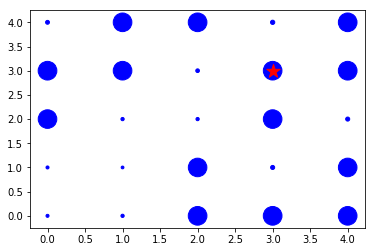

In [3]:
simulation.run(1)
simulation.show_beliefs()

What do you think this call to `run` is doing? Look at the code in **`simulate.py`** to find out (remember - you can see other files in the current directory by clicking on the `jupyter` logo in the top left of this notebook).

Spend a few minutes looking at the `run` method and the methods it calls to get a sense for what's going on.

#### What am I looking at?

The red star shows the robot's true position. The blue circles indicate the strength of the robot's belief that it is at any particular location.

Ideally we want the biggest blue circle to be at the same position as the red star.

In [4]:
# We will provide you with the function below to help you look
# at the raw numbers.

def show_rounded_beliefs(beliefs):
    for row in beliefs:
        for belief in row:
            print("{:0.3f}".format(belief), end="  ")
        print()
        
# The {:0.3f} notation is an example of "string 
# formatting" in Python. You can learn more about string 
# formatting at https://pyformat.info/

In [5]:
show_rounded_beliefs(simulation.beliefs)

0.003  0.069  0.070  0.004  0.070  
0.070  0.069  0.003  0.069  0.070  
0.069  0.002  0.002  0.069  0.003  
0.002  0.002  0.069  0.003  0.069  
0.002  0.002  0.070  0.070  0.069  


_____

## Part 2: Implement a 2D sense function.
As you can see, the robot's beliefs aren't changing. No matter how many times we call the simulation's sense method, nothing happens. The beliefs remain uniform.

### Instructions
1. Open `localizer.py` and complete the `sense` function.
3. Run the code in the cell below to import the localizer module (or reload it) and then test your sense function.
4. If the test passes, you've successfully implemented your first feature! Keep going with the project. If your tests don't pass (they likely won't the first few times you test), keep making modifications to the `sense` function until they do!

In [6]:
reload(localizer)
def test_sense():
    R = 'r'
    _ = 'g'

    simple_grid = [
        [_,_,_],
        [_,R,_],
        [_,_,_]
    ]

    p = 1.0 / 9
    initial_beliefs = [
        [p,p,p],
        [p,p,p],
        [p,p,p]
    ]

    observation = R

    expected_beliefs_after = [
        [1/11, 1/11, 1/11],
        [1/11, 3/11, 1/11],
        [1/11, 1/11, 1/11]
    ]

    p_hit  = 3.0
    p_miss = 1.0
    beliefs_after_sensing = localizer.sense(
        observation, simple_grid, initial_beliefs, p_hit, p_miss)

    if helpers.close_enough(beliefs_after_sensing, expected_beliefs_after):
        print("Tests pass! Your sense function is working as expected")
        return
    
    elif not isinstance(beliefs_after_sensing, list):
        print("Your sense function doesn't return a list!")
        return
        
    elif len(beliefs_after_sensing) != len(expected_beliefs_after):
        print("Dimensionality error! Incorrect height")
        return
              
    elif len(beliefs_after_sensing[0] ) != len(expected_beliefs_after[0]):
        print("Dimensionality Error! Incorrect width")
        return
    
    elif beliefs_after_sensing == initial_beliefs:
        print("Your code returns the initial beliefs.")
        return
        
    total_probability = 0.0
    for row in beliefs_after_sensing:
        for p in row:
            total_probability += p
    if abs(total_probability-1.0) > 0.001:
        
        print("Your beliefs appear to not be normalized")
        return
    
    print("Something isn't quite right with your sense function")

test_sense()

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0909090909090909, 0.0909090909090909, 0.0909090909090909], [0.0909090909090909, 0.2727272727272727, 0.0909090909090909], [0.0909090909090909, 0.0909090909090909, 0.0909090909090909]]
Tests pass! Your sense function is working as expected


## Integration Testing
Before we call this "complete" we should perform an **integration test**. We've verified that the sense function works on it's own, but does the localizer work overall?

Let's perform an integration test. First you you should execute the code in the cell below to prepare the simulation environment.

In [7]:
from simulate import Simulation
import simulate as sim
import helpers
reload(localizer)
reload(sim)
reload(helpers)

R = 'r'
G = 'g'
grid = [
    [R,G,G,G,R,R,R],
    [G,G,R,G,R,G,R],
    [G,R,G,G,G,G,R],
    [R,R,G,R,G,G,G],
    [R,G,R,G,R,R,R],
    [G,R,R,R,G,R,G],
    [R,R,R,G,R,G,G],
]

# Use small value for blur. This parameter is used to represent
# the uncertainty in MOTION, not in sensing. We want this test
# to focus on sensing functionality
blur = 0.1
p_hit = 100.0
simulation = sim.Simulation(grid, blur, p_hit)

>>>>>>>>new_beliefs<<<<<<<<<
[[0.03961965134706815, 0.0003961965134706814, 0.0003961965134706814, 0.0003961965134706814, 0.03961965134706815, 0.03961965134706815, 0.03961965134706815], [0.0003961965134706814, 0.0003961965134706814, 0.03961965134706815, 0.0003961965134706814, 0.03961965134706815, 0.0003961965134706814, 0.03961965134706815], [0.0003961965134706814, 0.03961965134706815, 0.0003961965134706814, 0.0003961965134706814, 0.0003961965134706814, 0.0003961965134706814, 0.03961965134706815], [0.03961965134706815, 0.03961965134706815, 0.0003961965134706814, 0.03961965134706815, 0.0003961965134706814, 0.0003961965134706814, 0.0003961965134706814], [0.03961965134706815, 0.0003961965134706814, 0.03961965134706815, 0.0003961965134706814, 0.03961965134706815, 0.03961965134706815, 0.03961965134706815], [0.0003961965134706814, 0.03961965134706815, 0.03961965134706815, 0.03961965134706815, 0.0003961965134706814, 0.03961965134706815, 0.0003961965134706814], [0.03961965134706815, 0.0396196513

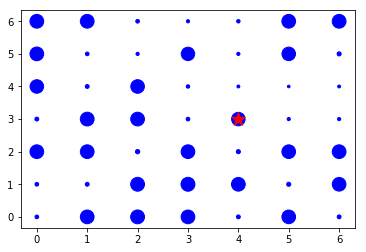

In [8]:
# Use control+Enter to run this cell many times and observe how 
# the robot's belief that it is in each cell (represented by the
# size of the corresponding circle) changes as the robot moves.
# The true position of the robot is given by the red star.

# Run this cell about 15-25 times and observe the results
simulation.run(1)
simulation.show_beliefs()

# If everything is working correctly you should see the beliefs
# converge to a single large circle at the same position as the 
# red star. Though, if your sense function is implemented correctly
# and this output is not converging as expected.. it may have to do
# with the `move` function bug; your next task!
#
# When you are satisfied that everything is working, continue
# to the next section

## Part 3: Identify and Reproduce a Bug
Software has bugs. That's okay.

A user of your robot called tech support with a complaint

> "So I was using your robot in a square room and everything was fine. Then I tried loading in a map for a rectangular room and it drove around for a couple seconds and then suddenly stopped working. Fix it!"

Now we have to debug. We are going to use a systematic approach.

1. Reproduce the bug
2. Read (and understand) the error message (when one exists)
3. Write a test that triggers the bug.
4. Generate a hypothesis for the cause of the bug.
5. Try a solution. If it fixes the bug, great! If not, go back to step 4.

### Step 1: Reproduce the bug
The user said that **rectangular environments** seem to be causing the bug. 

The code below is the same as the code you were working with when you were doing integration testing of your new feature. See if you can modify it to reproduce the bug.

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy,

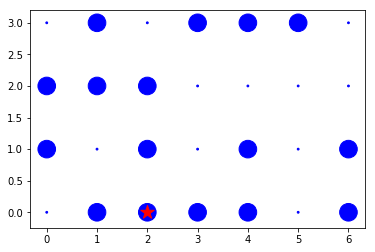

In [14]:
from simulate import Simulation
import simulate as sim
import helpers
reload(localizer)
reload(sim)
reload(helpers)

R = 'r'
G = 'g'

grid = [ 
    [R,G,G,G,R,R,R],
    [G,G,R,G,R,G,R],
    [G,R,G,G,G,G,R],
    [R,R,G,R,G,G,G],
    #[R,R,G,R,G,G,G],
    #[R,R,G,R,G,G,G],
    #[R,R,G,R,G,G,G]
]

blur = 0.001
p_hit = 100.0
simulation = sim.Simulation(grid, blur, p_hit)

# remember, the user said that the robot would sometimes drive around for a bit...
# It may take several calls to "simulation.run" to actually trigger the bug.
simulation.run(1)
simulation.show_beliefs()

In [15]:
simulation.run(1)

>>>>>>>>new_beliefs<<<<<<<<<
[[1.0452130251359236e-05, 0.09877398957816635, 0.0010778218928546527, 0.09877398957816635, 0.0009877398957816638, 0.000987495329273773, 1.0289085912765587e-05], [0.09876583736123669, 0.09878214179509603, 0.0009876583736123667, 0.0010452130251359232, 1.037060808206241e-05, 0.0010289085912765588, 1.037060808206241e-05], [0.09877398957816635, 1.0778218928546523e-05, 0.09877398957816635, 0.0010615174589952878, 0.09874138071044762, 0.0010370608082062413, 0.00098757685144307], [1.0533652420656058e-05, 0.0009876583736123667, 0.09878214179509605, 0.0009879029401202572, 0.09878214179509603, 0.0010615174589952878, 0.09874953292737731]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]

### Step 2: Read and Understand the error message
If you triggered the bug, you should see an error message directly above this cell. The end of that message should say:

```
IndexError: list index out of range
```

And just above that you should see something like

```
path/to/your/directory/localizer.pyc in move(dy, dx, beliefs, blurring)
     38             new_i = (i + dy ) % width
     39             new_j = (j + dx ) % height
---> 40             new_G[int(new_i)][int(new_j)] = cell
     41     return blur(new_G, blurring)
```

This tells us that line 40 (in the move function) is causing an `IndexError` because "list index out of range".

If you aren't sure what this means, use Google! 

Copy and paste `IndexError: list index out of range` into Google! When I do that, I see something like this:

![Search Results](http://i.imgur.com/gleBmBy.png)

Browse through the top links (often these will come from stack overflow) and read what people have said about this error until you are satisfied you understand how it's caused.

### Step 3: Write a test that reproduces the bug
This will help you know when you've fixed it and help you make sure you never reintroduce it in the future. You might have to try many potential solutions, so it will be nice to have a single function to call to confirm whether or not the bug is fixed

In [11]:
# According to the user, sometimes the robot actually does run "for a while" 
# - How can you change the code so the robot runs "for a while"?
# - How many times do you need to call simulation.run() to consistently
#   reproduce the bug?
# Modify the code below so that when the function is called 
# it consistently reproduces the bug.
def test_robot_works_in_rectangle_world():
    from simulate import Simulation
    import simulate as sim
    import helpers
    reload(localizer)
    reload(sim)
    reload(helpers)

    R = 'r'
    G = 'g'

    grid = [ 
        [R,G,G,G,R,R,R],
        [G,G,R,G,R,G,R],
        [G,R,G,G,G,G,R],
        [R,R,G,R,G,G,G],
        #[R,R,G,R,G,G,G],
        #[R,R,G,R,G,G,G],
        #[R,R,G,R,G,G,G]
    ]
    print('run test')
    blur = 0.001
    p_hit = 100.0
    for i in range(1000):
        simulation = sim.Simulation(grid, blur, p_hit)
        simulation.run(1)
    
test_robot_works_in_rectangle_world()

run test
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>

[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, d

[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 

>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>

[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1

[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1

>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>

>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>

[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, d

>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06

>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>

[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0

>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, 

>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]

>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>

>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy

>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy

>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j

>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, 

>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.000620347

>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.0

>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0

>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.00062

[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[n

>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>

>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>

[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1

[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i

>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new

>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_

[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>

[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>

[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, d

[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1

>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>

[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1

>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>

[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy

>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>

>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>

[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1

>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>

>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.0

[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0

>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<

[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, 

>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j

>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>

[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.00

>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>

>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<

>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>

>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>

>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]


[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.000620347394540943

[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0,

### Step 4: Generate a Hypothesis
In order to have a guess about what's causing the problem, it will be helpful to use some Python debuggin tools

The `pdb` module (`p`ython `d`e`b`ugger) will be helpful here!

#### Setting up the debugger 
1. Open `localizer.py` and uncomment the line to the top that says `import pdb`
2. Just before the line of code that is causing the bug `new_G[int(new_i)][int(new_j)] = cell`, add a new line of code that says `pdb.set_trace()`
3. Run your test by calling your test function (run the cell below this one)
4. You should see a text entry box pop up! For now, type `c` into the box and hit enter to **c**ontinue program execution. Keep typing `c` and enter until the bug is triggered again

In [12]:
test_robot_works_in_rectangle_world()

run test
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0822368421052632, 0.0008223684210526321, 0.0008223684210526321, 0.0008223684210526321, 0.0822368421052632, 0.0822368421052632, 0.0822368421052632], [0.0008223684210526321, 0.0008223684210526321, 0.0822368421052632, 0.0008223684210526321, 0.0822368421052632, 0.0008223684210526321, 0.0822368421052632], [0.0008223684210526321, 0.0822368421052632, 0.0008223684210526321, 0.0008223684210526321, 0.0008223684210526321, 0.0008223684210526321, 0.0822368421052632], [0.0822368421052632, 0.0822368421052632, 0.0008223684210526321, 0.0822368421052632, 0.0008223684210526321, 0.0008223684210526321, 0.0008223684210526321]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>

>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j

>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.000620347

[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]

[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>

[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<

[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<

>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<

[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>

>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<

[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.00062034739454094

[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 

>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[

>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, 

[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1

>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>

[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[ne

>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409

[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]

[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]

>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j

[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1

[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, d

>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[

>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>

[-1, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>

[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<

>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy,

[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.0620347

[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new

[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]

>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>

>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new

[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>

>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy,

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, 

>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>

[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.000620347394540943

>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.00062

[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.062034739

>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0

>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409

>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_

[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<

>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>

[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.0620347394540

>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<

[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, d

[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.00

>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j

[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]

[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i

[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.0620347

>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]


[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]

[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 

[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1

[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.00062034739454

>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, ne

>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<

[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433,

>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, n

[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]

[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]

>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new

[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]

[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i

>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<

>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.062034739454094

>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new

4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<

>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>

>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>

>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.00062034739454094

[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0

[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<

[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.00062034739

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, 

>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy,

>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j

[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>

[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.062034

>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 

>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<

[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.000620347394540943

[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0

>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j

>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>>new_beliefs<

7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>

[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473

>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<

[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy,

[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<

[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.062034

>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.062034739454094

[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0

[0, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>

>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<

>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy

[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432

>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.0

>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<

[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>

#### Using the debugger
The debugger works by pausing program execution wherever you write `pdb.set_trace()` in your code. You also have access to any variables which are accessible from that point in your code. 

Try running your test again. This time, when the text entry box shows up, type `new_i` and hit enter. You will see the value of the `new_i` variable show up in the debugger window. Play around with the debugger: find the values of `new_j`, `height`, and `width`. Do they seem reasonable / correct?

When you are done playing around, type `c` to continue program execution. Was the bug triggered? Keep playing until you have a guess about what is causing the bug.

### Step 5: Write a Fix
You have a hypothesis about what's wrong. Now try to fix it. When you're done you should call your test function again. You may want to remove (or comment out) the line you added to `localizer.py` that says `pdb.set_trace()` so your test can run without you having to type `c` into the debugger box.

In [13]:
test_robot_works_in_rectangle_world()

run test
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>

>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>

[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<

[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0

>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]


>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j

7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<

[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>

7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, n

>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>mo

>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]


[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]

>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j

[1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>

[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i

>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<

[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.00062034

[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]

[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, d

[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i

>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.062

[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]

[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]

[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, d

>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>

>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]


>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy,

>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.0620

>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>

[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, d

>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<

[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]

>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.0620347394540

[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i

[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0

[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, d

[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, d

[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, d

[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.000620347394540943

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy,

>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006

[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>>new_b

[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, d

>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.000620347394540943

>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>

>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>[new_i, 

>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<

>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.0620347394

>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy,

[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.0620347394540

>>>>>>>[dy, dx]<<<<<<<<<
[-1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, ne

>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<

[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, -1]
>>>>>>>[new_i, new_j]<<

[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]

>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473

[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]

[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.062034739454

[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0

[1, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[2, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]

>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, -1]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433], [0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433], [0.0006203473945409433, 0.0006203473945409433, 0.06203473945409432, 0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432]]
>>>>>>>move width<<<<<<<<<
7
>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, n

>>>>>>>move height<<<<<<<<<
4
>>>>>>>new_G<<<<<<<<<
[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[0, 0]
>>>>>>>[new_i, new_j]<<<<<<<<

>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[1, 0]
>>>>>>>>new_beliefs<<<<<<<<<
[[0.0006203473945409433, 0.06203473945409432, 0.06203473945409432, 0.06203473945409432, 0.0006203473945409433, 0.0006203473945409433, 0.0006203473945409433], [0.06203473945409432, 0.06203473945409432, 

>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[3, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 1]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 2]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 3]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 4]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 5]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[0, 6]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>>[new_i, new_j]<<<<<<<<<
[1, 0]
>>>>>>>[dy, dx]<<<<<<<<<
[-1, 0]
>>>>>>

## Congratulations!
You've implemented your first feature and successfully debugged a problem the robot was having with rectangular environments. Well done.